<a href="https://colab.research.google.com/github/butlerbt/SegmentingBuildings/blob/colab/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Modeling
### This notebook goes through several iterations of training models on the processed data

The general overview for each training iteration is:
1. "glob" the file paths of the training data
2. create the databunch in the format that is right for the model
3. Find the ideal learning rate
4. train pretrained model 
5. unfreeze the head and refine the model
6. export the model and make inferences in the "competition_predictions.ipynb"


 Mount the google drive


In [0]:
from google.colab import drive 
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [0]:
# install fastai
!curl https://course.fast.ai/setup/colab | bash

In [0]:
#import fastai
from fastai.vision import *
from fastai.callbacks import *

In [0]:
#check the gpu hardwear available 
from fastai.utils.collect_env import *
show_install(True)



```text
=== Software === 
python        : 3.6.9
fastai        : 1.0.60
fastprogress  : 0.2.2
torch         : 1.4.0
nvidia driver : 418.67
torch cuda    : 10.1 / is available
torch cudnn   : 7603 / is enabled

=== Hardware === 
nvidia gpus   : 1
torch devices : 1
  - gpu0      : 15079MB | Tesla T4

=== Environment === 
platform      : Linux-4.14.137+-x86_64-with-Ubuntu-18.04-bionic
distro        : #1 SMP Thu Aug 8 02:47:02 PDT 2019
conda env     : Unknown
python        : /usr/bin/python3
sys.path      : 
/env/python
/usr/lib/python36.zip
/usr/lib/python3.6
/usr/lib/python3.6/lib-dynload
/usr/local/lib/python3.6/dist-packages
/usr/lib/python3/dist-packages
/usr/local/lib/python3.6/dist-packages/IPython/extensions
/root/.ipython

Tue Feb 11 22:56:33 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.48.02    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+-------------

### Train model on one single zone, 256x256 pixel images, single channel (footprint) at slippy tile zoom of 19 

In [0]:
#"glob" the file paths of the training data
import glob
import pandas as pd
ims = glob.glob('drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/*.png')
df = pd.DataFrame({
    'img_path':ims,
    'mask_path':[im.replace('images', 'masks').replace('.png', '_mask.png') for im in ims],
    'valid':False
})
df.head()

,img_path,mask_path,valid
0,drive/My Drive/seg_building_foots/data/process...,drive/My Drive/seg_building_foots/data/process...,False
1,drive/My Drive/seg_building_foots/data/process...,drive/My Drive/seg_building_foots/data/process...,False
2,drive/My Drive/seg_building_foots/data/process...,drive/My Drive/seg_building_foots/data/process...,False
3,drive/My Drive/seg_building_foots/data/process...,drive/My Drive/seg_building_foots/data/process...,False
4,drive/My Drive/seg_building_foots/data/process...,drive/My Drive/seg_building_foots/data/process...,False


In [0]:
#find the index number of the validation set from the file path name and print the # of validation tiles 
holdout_grids = ['validation_']
valid_idx = [i for i,o in enumerate(df['img_path']) if any(c in str(o) for c in holdout_grids)]
print(len(valid_idx))


85


In [0]:
#define the validation set from the index numbers
df['valid'].iloc[valid_idx]=True

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [0]:
#check that it worked
df['valid'].iloc[valid_idx]

0      True
2      True
8      True
20     True
21     True
       ... 
432    True
435    True
441    True
442    True
443    True
Name: valid, Length: 85, dtype: bool

In [0]:
#Create the data Fast.ai data bunch  
#Override open method of SegmentationLabelList since our masks are 0 for class 0, 255 for class 1 (so need div=True)
def my_open(self, fn): return open_mask(fn, div=True)
SegmentationLabelList.open = my_open

src = (SegmentationItemList.from_df(path='', df=df, cols='img_path')
       .split_from_df(col='valid')
       .label_from_df(cols='mask_path', classes=["building", "not"]))

data = (src.transform(get_transforms(), size=256, tfm_y=True)
        .databunch(bs=32)
        .normalize(imagenet_stats))

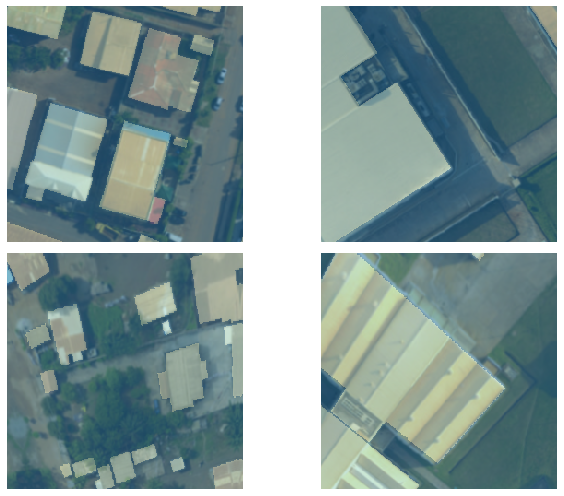

In [0]:
#display the databunch and labels to confirm it has been loaded correctly 
data.show_batch(2, figsize=(10,7))

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261803_253915.png


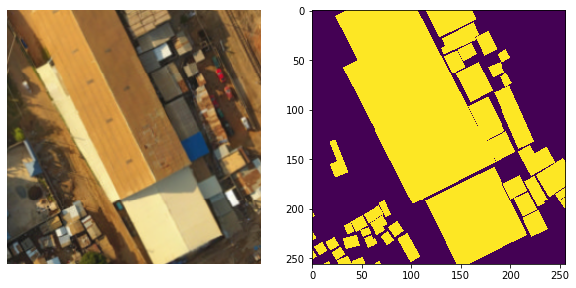

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261804_253915.png


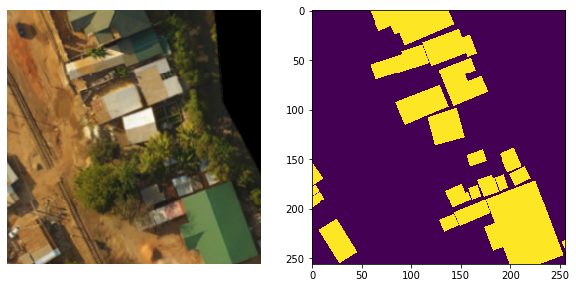

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261805_253915.png


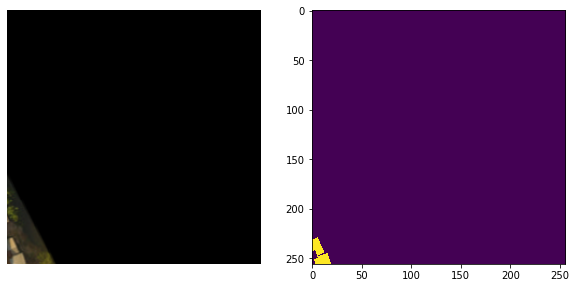

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261794_253916.png


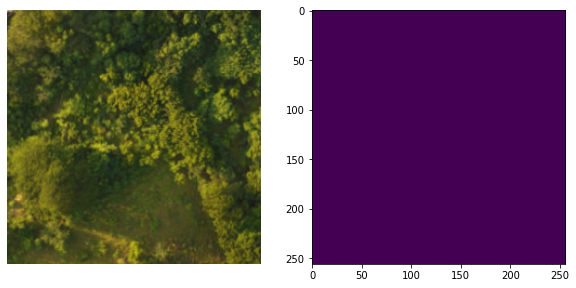

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261796_253916.png


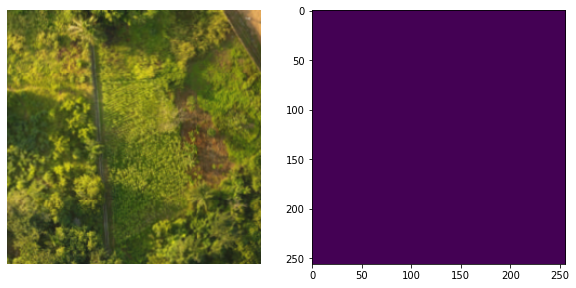

In [0]:
for idx in range(10,15):
    print(data.valid_ds.items[idx])
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5))
    data.valid_ds.x[idx].show(ax=ax1)
    ax2.imshow(image2np(data.valid_ds.y[idx].data*255))
    plt.show()
    

In [0]:
#load a unet resnet34 pretrained model 
learn = unet_learner(data, models.resnet34, metrics=dice, model_dir='drive/My Drive/seg_building_foots/models/')

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [0]:
#check the model is set up correctly 
learn.metrics

[<function fastai.metrics.dice>]

In [0]:
 learn.loss_func

FlattenedLoss of CrossEntropyLoss()

In [0]:
learn.summary()

In [0]:
#find the learning rate
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


In [0]:
learn.recorder.plot(0,2,suggestion=True)


AttributeError: ignored

In [0]:
lr = 1e-2
learn.fit_one_cycle(10, max_lr=lr 
                    )

epoch,train_loss,valid_loss,dice,time
0,0.856751,0.384590,0.209502,00:51
1,0.666606,0.388784,0.423452,00:20
2,0.593915,0.565314,0.156767,00:20
3,0.546494,0.340783,0.408872,00:20
4,0.501193,0.309930,0.419506,00:19
5,0.464851,0.317793,0.527682,00:19
6,0.436321,0.260486,0.574491,00:19
7,0.413459,0.269054,0.552481,00:19
8,0.395138,0.253477,0.588299,00:20
9,0.380151,0.255581,0.595266,00:19


In [0]:
lr = 1e-4
learn.fit_one_cycle(10, max_lr=lr 
                    )

epoch,train_loss,valid_loss,dice,time
0,0.641710,0.490550,0.303413,00:20
1,0.552388,0.327874,0.296795,00:21
2,0.489937,0.262174,0.487792,00:21
3,0.431643,0.226921,0.525332,00:20
4,0.390384,0.254404,0.566884,00:20
5,0.359258,0.203796,0.554248,00:20
6,0.337215,0.228342,0.593278,00:21
7,0.317502,0.203649,0.606948,00:20
8,0.302943,0.198958,0.604148,00:20
9,0.290821,0.196697,0.602252,00:20


In [0]:
lr = 1e-5
learn.fit_one_cycle(10, max_lr=lr 
                    )

epoch,train_loss,valid_loss,dice,time
0,1.491140,1.269229,0.239003,00:20
1,1.306613,0.971369,0.159505,00:20
2,1.091824,0.654446,0.031764,00:21
3,0.936851,0.555179,0.115988,00:21
4,0.826707,0.480637,0.192591,00:20
5,0.741181,0.429583,0.208256,00:20
6,0.675420,0.404574,0.316201,00:20
7,0.622482,0.377948,0.318467,00:20
8,0.578934,0.378169,0.364481,00:20
9,0.546291,0.376057,0.364335,00:20


In [0]:
lr = 3e-3
learn.fit_one_cycle(10, max_lr=lr 
                    )

epoch,train_loss,valid_loss,dice,time
0,0.764809,0.419697,0.031276,00:19
1,0.593264,0.340281,0.307540,00:20
2,0.564789,0.409340,0.461141,00:20
3,0.513287,0.326894,0.361081,00:20
4,0.486964,0.334368,0.244351,00:20
5,0.463955,0.253434,0.539770,00:20
6,0.428072,0.236560,0.610533,00:20
7,0.392066,0.211811,0.623744,00:20
8,0.361598,0.208508,0.652606,00:20
9,0.338412,0.202618,0.649020,00:20


In [0]:
learn.model.eval()
outputs,labels,losses = learn.get_preds(ds_type=DatasetType.Valid,n_batch=3,with_loss=True)
losses.shape

torch.Size([5570560])

In [0]:
losses_reshaped = torch.mean(losses.view(outputs.shape[0],-1), dim=1)
sorted_idx = torch.argsort(losses_reshaped,descending=True)
losses_reshaped.shape

torch.Size([85])

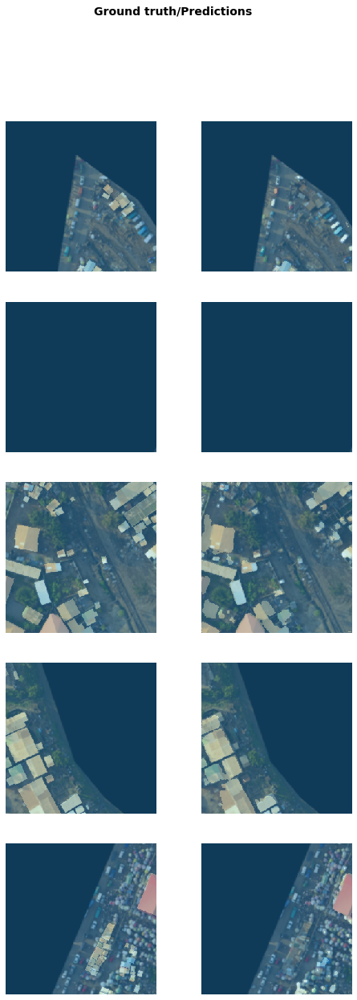

In [0]:
learn.show_results()

In [0]:
learn.save('stage-1')

In [0]:
# learn.load('acc-665946-focaldice-stage1-moduleclasse')
learn.load('stage-1');
learn.unfreeze()

In [0]:
lr = 3e-3

lrs = slice(lr/400,lr/4)
learn.fit_one_cycle(30, lrs, pct_start=0.8)


epoch,train_loss,valid_loss,dice,time
0,0.246226,0.198144,0.649752,00:20
1,0.249512,0.197434,0.654523,00:20
2,0.250882,0.194113,0.655177,00:19
3,0.249758,0.189380,0.676381,00:19
4,0.248370,0.186042,0.684473,00:19
5,0.244340,0.183708,0.695813,00:20
6,0.239103,0.179391,0.715664,00:20
7,0.233298,0.167970,0.729655,00:19
8,0.227187,0.166870,0.732945,00:19
9,0.223789,0.173300,0.737344,00:19


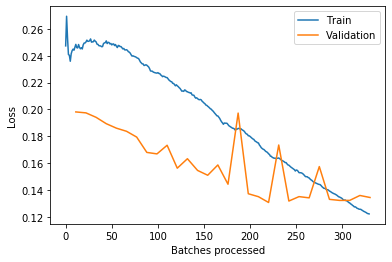

In [0]:
learn.recorder.plot_losses()

In [0]:
learn.model.eval()
outputs,labels,losses = learn.get_preds(ds_type=DatasetType.Valid,n_batch=6,with_loss=True)
losses_reshaped = torch.mean(losses.view(outputs.shape[0],-1), dim=1)
sorted_idx = torch.argsort(losses_reshaped,descending=True)

In [0]:
learn.save('stage-2')

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261804_253925.png
loss: 0.5719613432884216


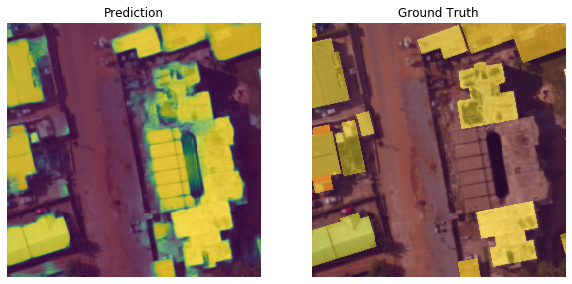

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261793_253917.png
loss: 0.4988357424736023


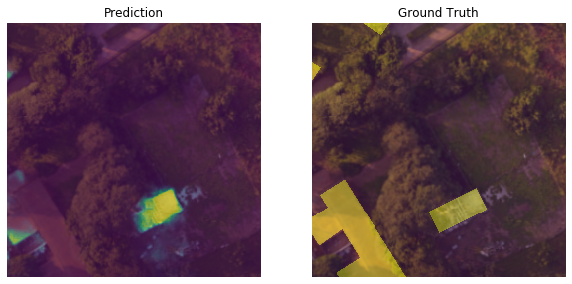

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261799_253926.png
loss: 0.4942941665649414


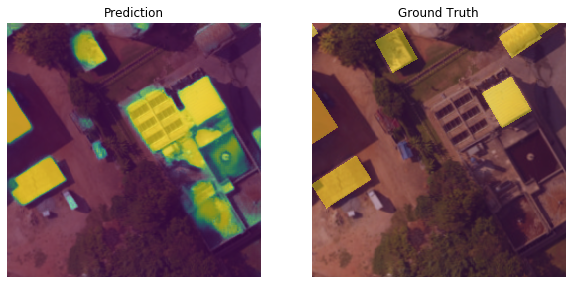

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261808_253941.png
loss: 0.3884500563144684


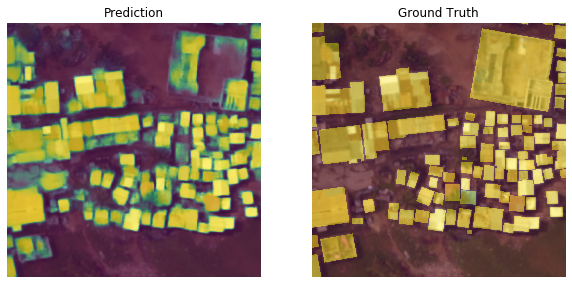

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261808_253934.png
loss: 0.3493153154850006


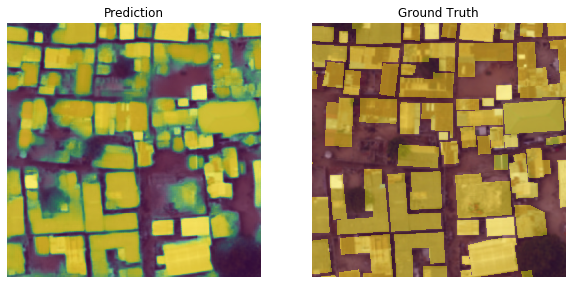

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261796_253920.png
loss: 0.3308558166027069


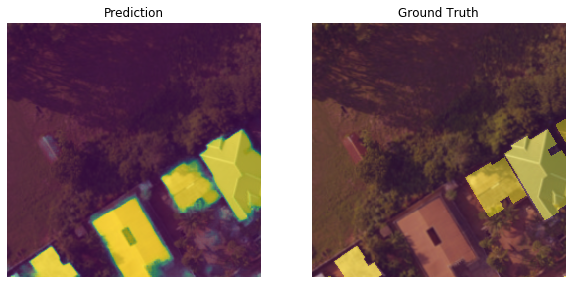

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261804_253919.png
loss: 0.328434020280838


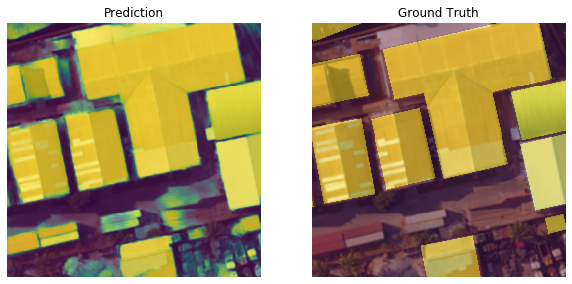

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261797_253913.png
loss: 0.3215813934803009


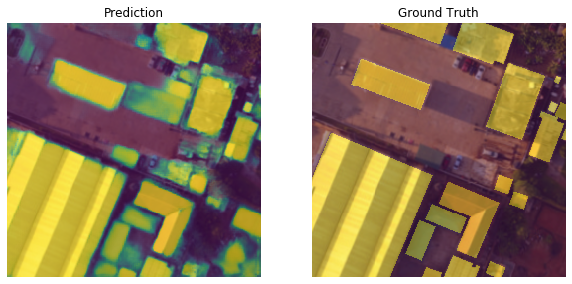

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261800_253932.png
loss: 0.3140178918838501


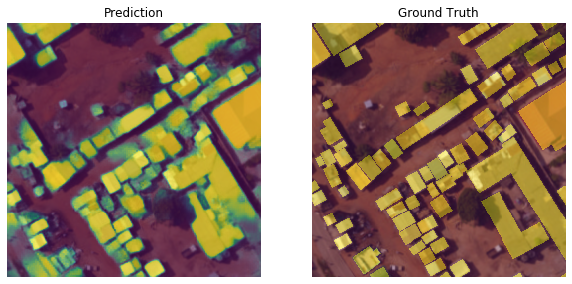

./drive/My Drive/seg_building_foots/data/processed_1band_256_19/images/acc665946validation_19_261808_253935.png
loss: 0.3083488643169403


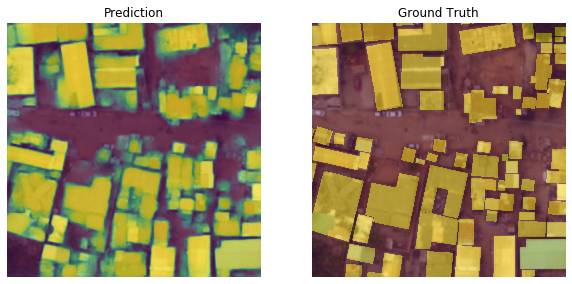

In [0]:
# look at predictions vs actual sorted by highest image-wise loss first

for i in sorted_idx[:5]:

    print(f'{data.valid_ds.items[i]}')
    print(f'loss: {losses_reshaped[i].mean()}')
    
    

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
    data.valid_ds.x[i].show(ax=ax1)
    ax1.imshow(outputs[i,1], alpha = .6)
    data.valid_ds.x[i].show(ax=ax2)
    ax2.imshow(labels[i,0], alpha = .4)

    ax1.set_title('Prediction')
    ax2.set_title('Ground Truth')
    
    plt.show()
    

### Train model on 1028 images, at zoom 19 and 17

In [0]:
import glob
import pandas as pd
ims = glob.glob('drive/My Drive/seg_building_foots/data/processed_1band_1028_19/images/*.png')
df_1 = pd.DataFrame({
    'img_path':ims,
    'mask_path':[im.replace('images', 'masks').replace('.png', '_mask.png') for im in ims],
    'valid':False
})
df.head()

NameError: ignored

In [0]:

ims = glob.glob('drive/My Drive/seg_building_foots/data/processed_1band_1028_17/images/*.png')
df_2 = pd.DataFrame({
    'img_path':ims,
    'mask_path':[im.replace('images', 'masks').replace('.png', '_mask.png') for im in ims],
    'valid':False
})
df_2.head()

In [0]:
df_3 = pd.concat([df, df_2], axis = 0)

In [0]:
holdout_grids = ['validation_']
valid_idx = [i for i,o in enumerate(df_3['img_path']) if any(c in str(o) for c in holdout_grids)]
print(len(valid_idx))






106


In [0]:
df_3['valid'].iloc[valid_idx]=True

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [0]:
# Override open method of SegmentationLabelList since our masks are 0 for class 0, 255 for class 1 (so need div=True)
# learn.destroy()


from fastai.utils.mem import gpu_mem_get_free_no_cache
free = gpu_mem_get_free_no_cache()
# the max size of bs depends on the available GPU RAM
if free > 8200: bs=3
else:           bs=1
print(f"using bs={bs}, have {free}MB of GPU RAM free")

def my_open(self, fn): return open_mask(fn, div=True)
SegmentationLabelList.open = my_open

src = (SegmentationItemList.from_df(path='', df=df_3, cols='img_path')
       .split_from_df(col='valid')
       .label_from_df(cols='mask_path', classes=["building", "not"]))

data = (src.transform(get_transforms(), size=512, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

using bs=3, have 15068MB of GPU RAM free


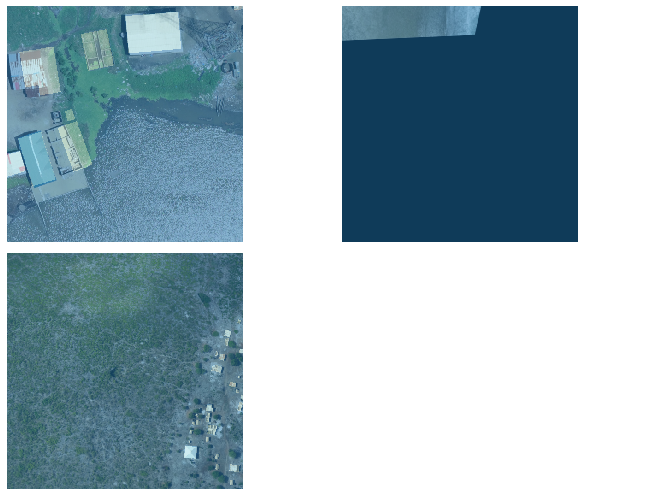

In [0]:
data.show_batch(2, figsize=(10,7))

In [0]:
learn = unet_learner(data, models.resnet34, metrics=dice, model_dir='drive/My Drive/seg_building_foots/models/')

epoch,train_loss,valid_loss,dice,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


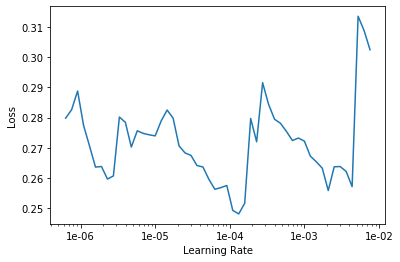

In [0]:
learn.load('stage-2')
lr_find(learn)
learn.recorder.plot()


In [0]:
learn.recorder.plot()

In [0]:
lr = 3e-3


learn.fit_one_cycle(10, slice(lr), pct_start=0.8)


epoch,train_loss,valid_loss,dice,time
0,0.168972,0.101319,0.640746,02:42
1,0.137313,0.083600,0.656521,01:49
2,0.171332,0.388380,0.535925,01:47
3,0.128314,0.086768,0.723350,01:48
4,0.106081,0.077461,0.714269,01:47
5,0.169679,0.102527,0.663849,01:47
6,0.452585,0.166513,0.477350,01:47
7,0.134232,0.088837,0.623629,01:46
8,0.100041,0.080744,0.642309,01:45
9,0.080960,0.074409,0.698078,01:46


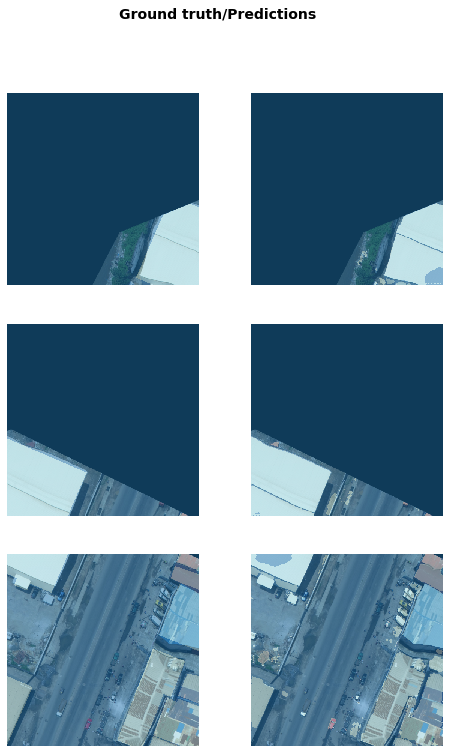

In [0]:
learn.show_results()

In [0]:
learn.save('stage-1-big')

In [0]:
learn.load('stage-1-big');

In [0]:
learn.unfreeze()
lrs = slice(1e-6, lr/10)

In [0]:
learn.fit_one_cycle(10, lrs)

epoch,train_loss,valid_loss,dice,time
0,0.081811,0.073579,0.725085,01:50
1,0.080009,0.074824,0.691671,01:50
2,0.083024,0.073481,0.701282,01:50
3,0.075358,0.067589,0.763957,01:50
4,0.069908,0.068141,0.743556,01:50
5,0.074656,0.066862,0.766146,01:50
6,0.065583,0.064346,0.778463,01:50
7,0.061378,0.064140,0.758008,01:50
8,0.067016,0.063918,0.770470,01:50
9,0.061153,0.063937,0.779054,01:51


In [0]:
learn.save('stage-2-big')

In [0]:
learn.export("drive/My Drive/seg_building_foots/models/stage-2-big.pkl")

In [0]:
inference_learner = load_learner(path='drive/My Drive/seg_building_foots/models/', file='stage-2-big.pkl')

### Train model on 128 zoom 19


In [0]:
import glob
import pandas as pd
ims = glob.glob('drive/My Drive/seg_building_foots/data/processed/images/*.png')
df = pd.DataFrame({
    'img_path':ims,
    'mask_path':[im.replace('images', 'masks').replace('.png', '_mask.png') for im in ims],
    'valid':False
})
df.head()
len(df)

27981

In [0]:
holdout_grids = ['validation_']
valid_idx = [i for i,o in enumerate(df['img_path']) if any(c in str(o) for c in holdout_grids)]
print(len(valid_idx))
df['valid'].iloc[valid_idx]=True

5043


/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [0]:
# Override open method of SegmentationLabelList since our masks are 0 for class 0, 255 for class 1 (so need div=True)
# learn.destroy()

tfms = get_transforms(flip_vert=True, max_warp=0.1, max_rotate=20, max_zoom=2, max_lighting=0.3)

def my_open(self, fn): return open_mask(fn, div=True)
SegmentationLabelList.open = my_open

src = (SegmentationItemList.from_df(path='', df=df, cols='img_path')
       .split_from_df(col='valid')
       .label_from_df(cols='mask_path', classes=["building", "not"]))

data = (src.transform(tfms, size=128, tfm_y=True)
        .databunch(bs=32)
        .normalize(imagenet_stats))

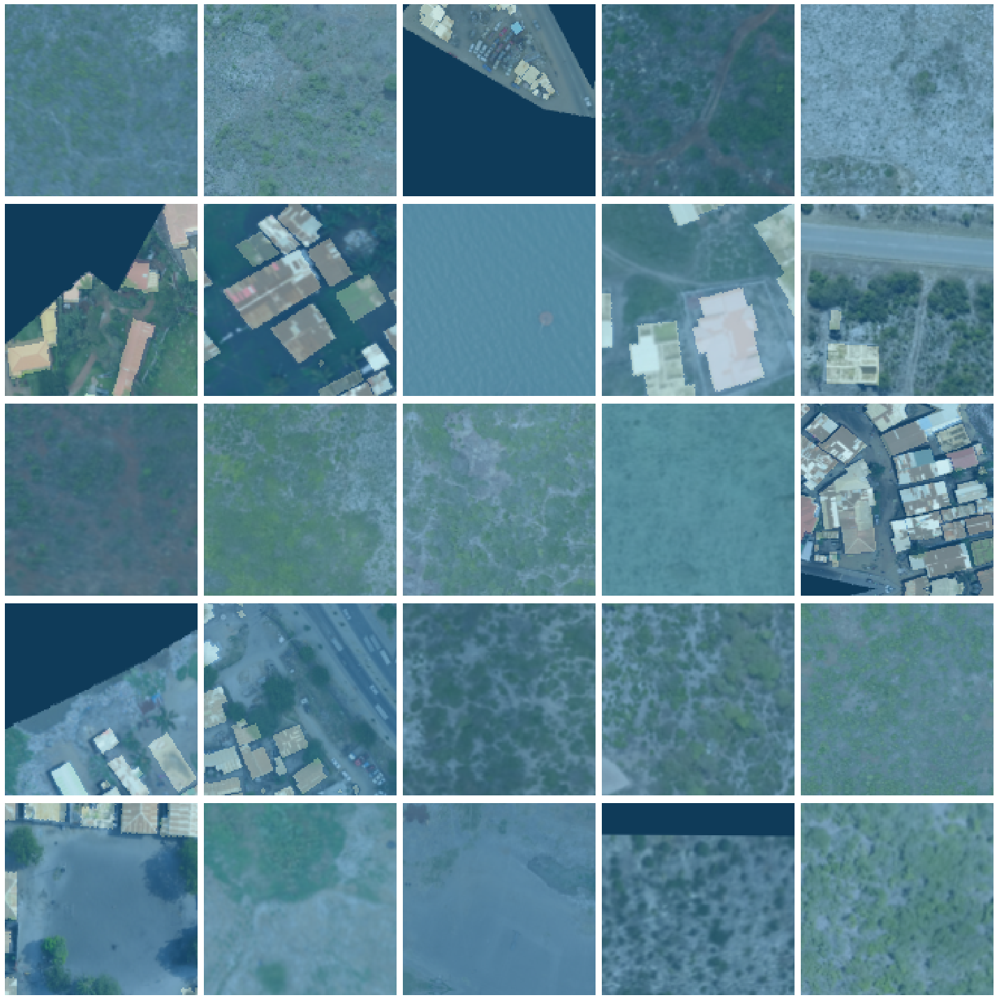

In [0]:
data.show_batch()

In [0]:
learn = unet_learner(data, 
                     models.resnet34, metrics=dice,
                     model_dir='drive/My Drive/seg_building_foots/models/')

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [0]:
learn.lr_find()

epoch,train_loss,valid_loss,dice,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 3.02E-05
Min loss divided by 10: 5.75E-03


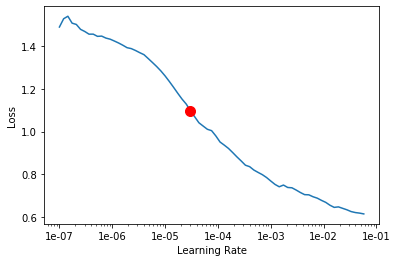

In [0]:
learn.recorder.plot(0,2, suggestion=True)

In [0]:
lr = 1e-3
learn.fit_one_cycle(20, max_lr=lr, 
                    
                   )

epoch,train_loss,valid_loss,dice,time
0,0.147862,0.138842,0.812644,1:28:03
1,0.127001,0.129410,0.830218,06:50
2,0.128627,0.121377,0.839137,06:33
3,0.123554,0.117954,0.844771,06:31
4,0.121491,0.120092,0.840268,06:31
5,0.118450,0.117891,0.858073,06:30
6,0.117167,0.115786,0.850091,06:28
7,0.107535,0.108243,0.861161,06:31
8,0.109181,0.109920,0.859007,06:30
9,0.103726,0.111718,0.853462,06:30


In [0]:
# learn.save('full-128-stage1')
learn.load('full-128-stage1')
learn.model.train()
learn.unfreeze()
# learn.lr_find()
# learn.recorder.plot(suggestion=True)

In [0]:
lr = 3e-3

lrs = slice(lr/400,lr/4)
learn.fit_one_cycle( 5, lrs, pct_start=0.8)
                    


epoch,train_loss,valid_loss,dice,time
0,0.097995,0.098864,0.872383,1:39:50
1,0.104590,0.100383,0.870739,06:10
2,0.099729,0.102218,0.867125,05:58
3,0.107918,0.102660,0.867607,05:56
4,0.095672,0.097864,0.872718,05:58


In [0]:
learn.save('full-128-stage2')

In [0]:
learn.destroy();

this Learner object self-destroyed - it still exists, but no longer usable


## Now Train model on 256 zoom 19


In [0]:
#google drive times out and prenvents the glob from operating 80% of the time.. just keep running the cell till it collects 27000 files 

import glob
import pandas as pd
ims = glob.glob('drive/My Drive/seg_building_foots/data/processed/images/*.png')
df = pd.DataFrame({
    'img_path':ims,
    'mask_path':[im.replace('images', 'masks').replace('.png', '_mask.png') for im in ims],
    'valid':False
})
df.head()
len(df)

27981

In [0]:
holdout_grids = ['validation_']
valid_idx = [i for i,o in enumerate(df['img_path']) if any(c in str(o) for c in holdout_grids)]
print(len(valid_idx))
df['valid'].iloc[valid_idx]=True

5043


/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [0]:
#Same as above, google drive times out and prenvents the glob from operating 80% of the time.. just keep running the cell till it successfully creates 
#the data bunch


# Override open method of SegmentationLabelList since our masks are 0 for class 0, 255 for class 1 (so need div=True)
# learn.destroy()

tfms = get_transforms(flip_vert=True, max_warp=0.1, max_rotate=20, max_zoom=2, max_lighting=0.3)

def my_open(self, fn): return open_mask(fn, div=True)
SegmentationLabelList.open = my_open

src = (SegmentationItemList.from_df(path='', df=df, cols='img_path')
       .split_from_df(col='valid')
       .label_from_df(cols='mask_path', classes=["building", "not"]))

data = (src.transform(tfms, size=256, tfm_y=True)
        .databunch(bs=32)
        .normalize(imagenet_stats))

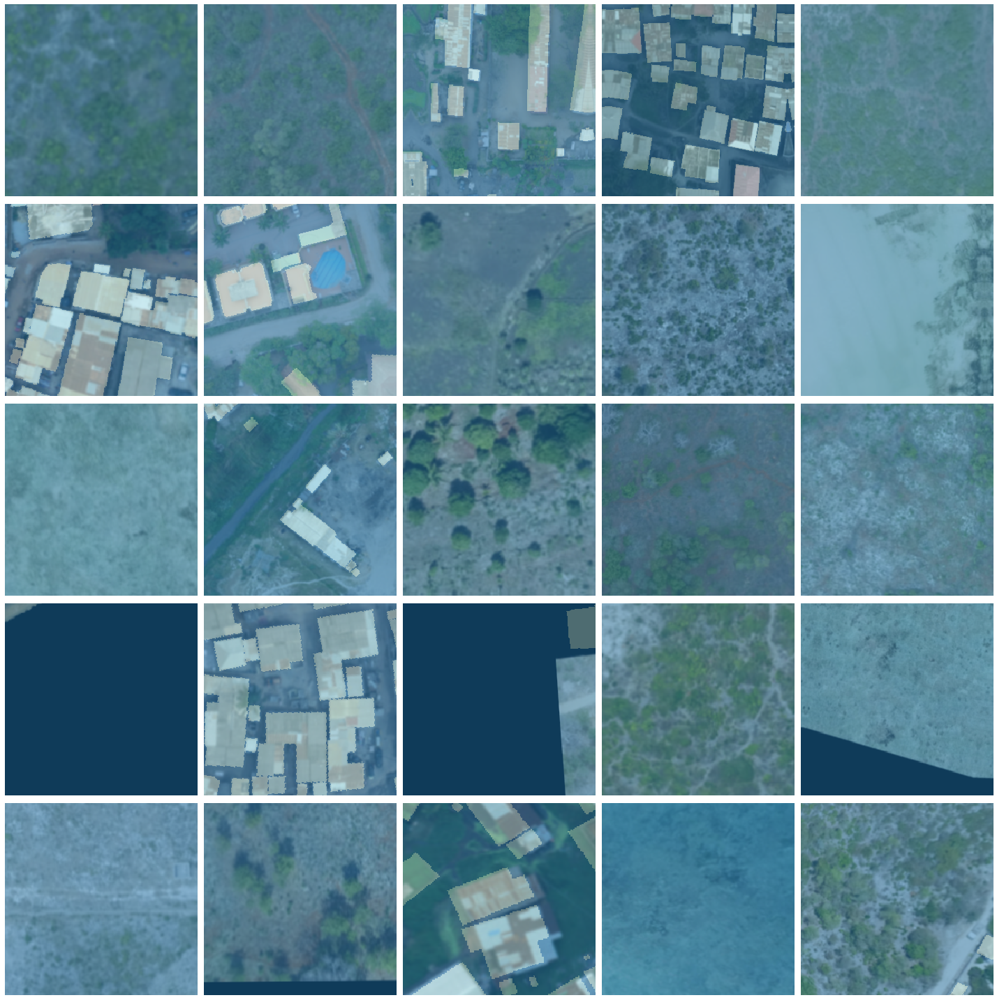

In [0]:
data.show_batch()

In [0]:
learn = unet_learner(data, 
                     models.resnet34, metrics=dice,
                     model_dir='drive/My Drive/seg_building_foots/models')

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [0]:
learn.load('full-128-stage2');

NameError: ignored

epoch,train_loss,valid_loss,dice,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


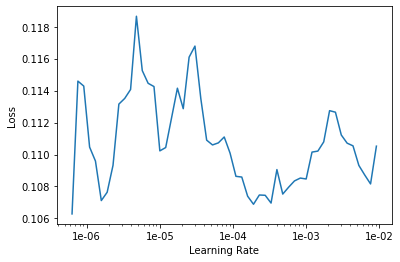

In [0]:
lr_find(learn)
learn.recorder.plot()

In [0]:
lr=1e-4
learn.fit_one_cycle(10, slice(lr), pct_start=0.8)

epoch,train_loss,valid_loss,dice,time
0,0.107034,0.094649,0.874969,1:41:59
1,0.099295,0.093338,0.879731,18:54
2,0.100005,0.092396,0.880277,18:54
3,0.095415,0.091784,0.880951,18:55
4,0.100544,0.091151,0.882138,18:55
5,0.100939,0.090756,0.882166,18:56
6,0.091674,0.091174,0.880640,18:56
7,0.097400,0.090864,0.882683,18:46
8,0.098955,0.089238,0.884367,18:31
9,0.093180,0.089238,0.884440,18:31


In [0]:
learn.save('256-full-stage-1')

In [0]:
print('saved')

saved


In [0]:
learn.load('256-full-stage-1');

In [0]:
learn.unfreeze()
lr=1e-3
lrs = slice(1e-6,lr/10)
learn.fit_one_cycle(3, lrs)

epoch,train_loss,valid_loss,dice,time
0,0.096317,0.089324,0.885676,1:35:37
1,0.094034,0.089423,0.886483,19:14
2,0.090814,0.088776,0.885640,19:21


In [0]:
learn.save('256-full-stage-2')
print('saved')

saved


In [0]:
learn.export('drive/My Drive/seg_building_foots/models/256-full-stage-2.pkl')
print('exported')

exported


In [0]:
learner = learn
from skimage import io
import time

def get_pred(learner, tile):
#     pdb.set_trace()

    t_img = Image(pil2tensor(tile[:,:,:3],np.float32).div_(255))
    outputs = learner.predict(t_img)
    im = image2np(outputs[2].sigmoid())
    im = (im*255).astype('uint8')
    return im

In [0]:
# try a different tile by changing or adding your own urls to list

urls = [
  'https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png',
  'https://tiles.openaerialmap.org/5b1e6fd42b6a08001185f7bf/0/5b1e6fd42b6a08001185f7c0/20/569034/537093.png',
  'https://tiles.openaerialmap.org/5beaaba463f9420005ef8db0/0/5beaaba463f9420005ef8db1/19/313479/283111.png',
  'https://tiles.openaerialmap.org/5d050c3673de290005853a91/0/5d050c3673de290005853a92/18/203079/117283.png',
  'https://tiles.openaerialmap.org/5c88ff77225fc20007ab4e26/0/5c88ff77225fc20007ab4e27/21/1035771/1013136.png',
  'https://tiles.openaerialmap.org/5d30bac2e757aa0005951652/0/5d30bac2e757aa0005951653/19/136700/197574.png'
]

https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png
GPU inference took 2.69 secs


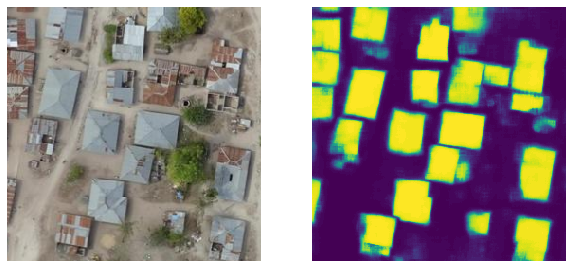

https://tiles.openaerialmap.org/5b1e6fd42b6a08001185f7bf/0/5b1e6fd42b6a08001185f7c0/20/569034/537093.png
GPU inference took 0.33 secs


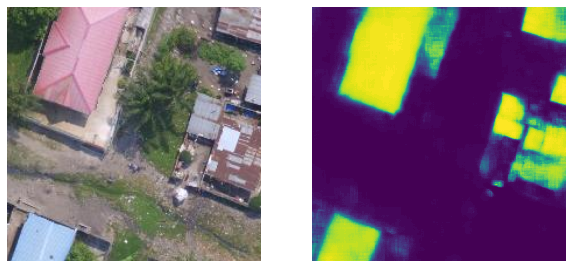

https://tiles.openaerialmap.org/5beaaba463f9420005ef8db0/0/5beaaba463f9420005ef8db1/19/313479/283111.png
GPU inference took 0.42 secs


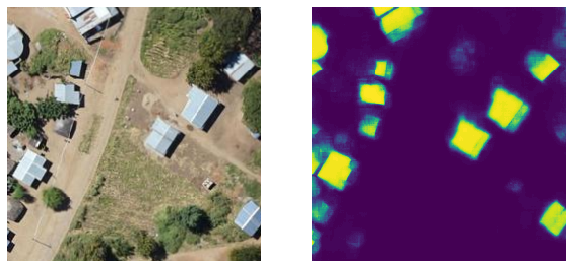

https://tiles.openaerialmap.org/5d050c3673de290005853a91/0/5d050c3673de290005853a92/18/203079/117283.png
GPU inference took 0.30 secs


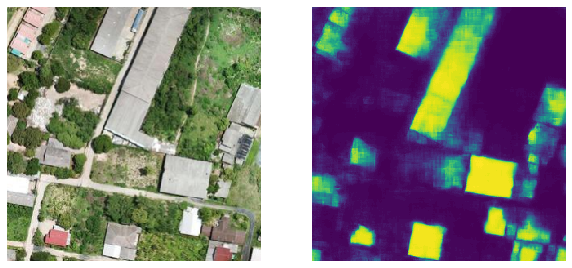

https://tiles.openaerialmap.org/5c88ff77225fc20007ab4e26/0/5c88ff77225fc20007ab4e27/21/1035771/1013136.png
GPU inference took 0.44 secs


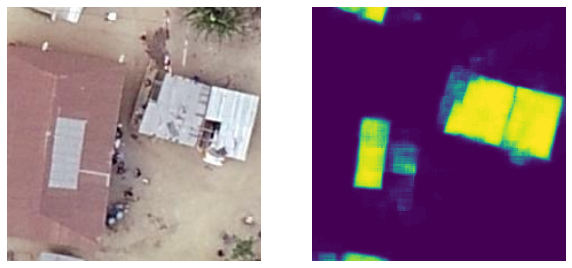

https://tiles.openaerialmap.org/5d30bac2e757aa0005951652/0/5d30bac2e757aa0005951653/19/136700/197574.png
GPU inference took 0.26 secs


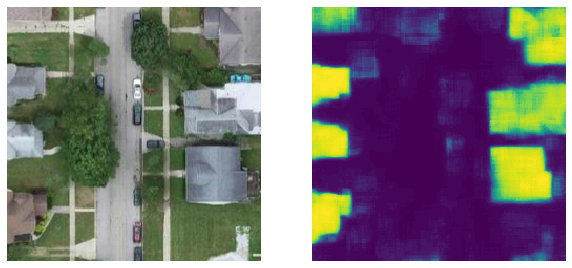

In [0]:
inference_learner = learn
for url in urls:
  t1 = time.time()
  test_tile = io.imread(url)
  result = get_pred(inference_learner, test_tile)
  t2 = time.time()
  
  print(url)
  print(f'GPU inference took {t2-t1:.2f} secs')
  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
  ax1.imshow(test_tile)
  ax2.imshow(result[:,:,1])
  ax1.axis('off')
  ax2.axis('off')
  plt.show()

https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png
GPU inference took 0.10 secs


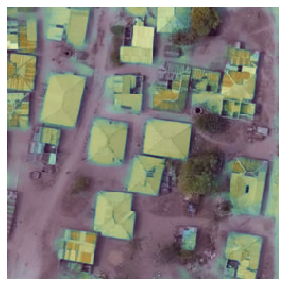

https://tiles.openaerialmap.org/5b1e6fd42b6a08001185f7bf/0/5b1e6fd42b6a08001185f7c0/20/569034/537093.png
GPU inference took 0.09 secs


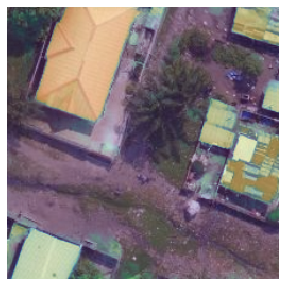

https://tiles.openaerialmap.org/5beaaba463f9420005ef8db0/0/5beaaba463f9420005ef8db1/19/313479/283111.png
GPU inference took 0.09 secs


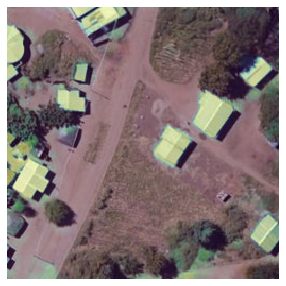

https://tiles.openaerialmap.org/5d050c3673de290005853a91/0/5d050c3673de290005853a92/18/203079/117283.png
GPU inference took 0.09 secs


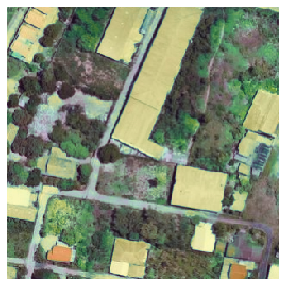

https://tiles.openaerialmap.org/5c88ff77225fc20007ab4e26/0/5c88ff77225fc20007ab4e27/21/1035771/1013136.png
GPU inference took 0.09 secs


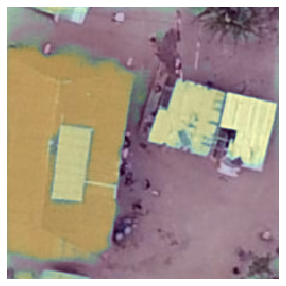

https://tiles.openaerialmap.org/5d30bac2e757aa0005951652/0/5d30bac2e757aa0005951653/19/136700/197574.png
GPU inference took 0.10 secs


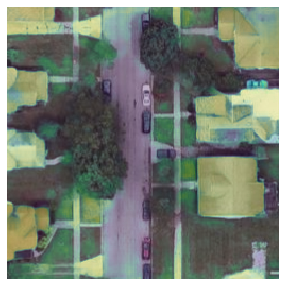

In [0]:
inference_learner = learn
for url in urls:
  t1 = time.time()
  test_tile = io.imread(url)
  result = get_pred(inference_learner, test_tile)
  t2 = time.time()
  
  print(url)
  print(f'GPU inference took {t2-t1:.2f} secs')
  fig, ax1 = plt.subplots(1,1, figsize=(10,5))
  ax1.imshow(test_tile)
  ax1.imshow(result[:,:,1], alpha=.3)
  ax1.axis('off')
  plt.show()

# New Section